In [1]:
from astropy.wcs import WCS
from astropy.io import fits
import numpy as np 
import os 
import glob
import matplotlib.pyplot as plt
from natural_cubic_spline import continuum

In [38]:
import glob
import os
import shutil
path_utiles= '/home/nacho/molecfit_test/ordenes_telurica2_utiles'
path_fits = "/home/nacho/molecfit_test/HIP093148/HIP093148_sum/VAC_flux/fsr1.05/"


fits_files = glob.glob(os.path.join(path_fits, '*.fits'))

# rangos de interes
rangos_interes = list(range(43,49))+ list(range(51,58))
rangos_interes = ['m'+str(numeros) for numeros in rangos_interes]

os.makedirs(path_utiles, exist_ok=True)
# extraer los ordenes de echelle utiles
for file in fits_files:
    filename = os.path.basename(file)
    if any(rango in filename for rango in rangos_interes):
        destino = os.path.join(path_utiles,filename)
        shutil.copy(file,destino)
        print(f'copiado:{filename} a {path_utiles}')
    else:
        print(f'no copiado:{filename}')


copiado:HIP093148_sum_m56_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
copiado:HIP093148_sum_m47_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
copiado:HIP093148_sum_m45_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
copiado:HIP093148_sum_m48_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
no copiado:HIP093148_sum_m60_fsr1.05_VAC.fits
no copiado:HIP093148_sum_m50_fsr1.05_VAC.fits
copiado:HIP093148_sum_m54_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
no copiado:HIP093148_sum_m61_fsr1.05_VAC.fits
copiado:HIP093148_sum_m53_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
copiado:HIP093148_sum_m55_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
no copiado:HIP093148_sum_m42_fsr1.05_VAC.fits
copiado:HIP093148_sum_m57_fsr1.05_VAC.fits a /home/nacho/molecfit_test/ordenes_telurica_utiles
copiado:HIP093148_sum_m46_fsr1.05_VAC.fits a /home/nacho

In [51]:
def extraer_datos_originales(archivo_original):
    with fits.open(archivo_original) as hdul:
        data = hdul[0].data
        hdr = hdul[0].header
        n_pix = data.shape[0]
        w = WCS(hdr, naxis = 1)
        long_ond = w.pixel_to_world(np.arange(n_pix)).value
        flux_norm, y_fit, w_excl, f_excl =\
            continuum(long_ond,data,low_rej=1.8,high_re=0.0,niter=10,order=3,plots=False)
        return(long_ond, flux_norm)

def extraer_datos_calctrans(archivo_trans):
    with fits.open(archivo_trans) as hdul:
        data = hdul[1].data
        flux = data['CFLUX']
        long_ond = data['LAMBDA']*1e4
    return(long_ond, flux)

def plot_telluric_encima(carpeta_fits, carpeta, archivo_guardar, patron='*fits'):
    
    """inputs: carpeta_fits: es la carpeta correspondiente a los archivos fits a comparar con 
    la telurica
    carpeta: corresponde a la carpeta en la cual están los archivos fits de las teluricas
    archivo_guardar: ruta de la carpeta donde se guardaran las imagenes, esta carpeta puede 
    no existir 
    patron: es el patron de reconocimiento de los archivos fits, si es *fits será el archivo original y
    si es par_tac.fits es el archivo corregido por calctrans"""
    
    # Archivo skycalc
    long_sk = []
    flux_sk = []
    with open("/home/nacho/molecfit_test/transmission_J_AUG.txt", 'r') as txt:
        for linea in txt:
            partes = linea.strip().split()
            long_sk.append(float(partes[0])*10)
            flux_sk.append(float(partes[1]))
    
    # Convertir a arrays numpy para facilitar el manejo
    long_sk = np.array(long_sk)
    flux_sk = np.array(flux_sk)
    
    archivos_telurica = glob.glob(os.path.join(carpeta, '*fits'))
    archivos_telurica.sort()
    
    # Buscar archivos según el patrón especificado
    archivos = glob.glob(os.path.join(carpeta_fits, patron))
    archivos.sort()
    
    # Crear directorio para guardar las figuras
    os.makedirs(archivo_guardar, exist_ok=True)
    
    print("Archivos telúricos:", archivos_telurica)
    print("Archivos originales:", archivos)
    
    # Asegurarse de que tenemos el mismo número de archivos
    if len(archivos_telurica) != len(archivos):
        print(f"¡Advertencia! Número diferente de archivos: {len(archivos_telurica)} vs {len(archivos)}")
    
    for i, a in zip(archivos_telurica, archivos):
        # Extraer datos telúricos
        long_ond_tel, flux_norm_tel = extraer_datos_originales(i)
        
        # Extraer datos originales
        if "par_tac" in a:
            long_ond_orig, flux_orig = extraer_datos_calctrans(a)
        else:
            long_ond_orig, flux_orig = extraer_datos_originales(a)
        
        # Determinar el rango de longitud de onda
        long_min = min(long_ond_orig.min(), long_ond_tel.min())
        long_max = max(long_ond_orig.max(), long_ond_tel.max())
        
        # Dividir el rango en 4 segmentos
        segmentos = np.linspace(long_min, long_max, 5)
        
        # Crear figura con 4 subplots (2x2)
        fig, axes = plt.subplots(2, 2, figsize=(15, 10))
        axes = axes.flatten()
        
        for idx in range(4):
            # Límites del segmento actual
            lim_inf = segmentos[idx]
            lim_sup = segmentos[idx + 1]
            
            # Filtrar datos originales para este segmento
            mask_orig = (long_ond_orig >= lim_inf) & (long_ond_orig <= lim_sup)
            long_seg_orig = long_ond_orig[mask_orig]
            flux_seg_orig = flux_orig[mask_orig]
            
            # Filtrar datos telúricos para este segmento
            mask_tel = (long_ond_tel >= lim_inf) & (long_ond_tel <= lim_sup)
            long_seg_tel = long_ond_tel[mask_tel]
            flux_seg_tel = flux_norm_tel[mask_tel]
            
            # Filtrar datos skycalc para este segmento
            mask_sk = (long_sk >= lim_inf) & (long_sk <= lim_sup)
            long_seg_sk = long_sk[mask_sk]
            flux_seg_sk = flux_sk[mask_sk]
            
            # Graficar en el subplot correspondiente
            axes[idx].plot(long_seg_orig, flux_seg_orig, label='Flujo original', alpha=0.7)
            axes[idx].plot(long_seg_tel, flux_seg_tel, label='Telúrico normalizado', alpha=0.7)
            
            # Graficar skycalc solo si hay datos en este segmento
            if len(long_seg_sk) > 0:
                axes[idx].plot(long_seg_sk, flux_seg_sk, label='Skycalc', alpha=0.7, linestyle='--')
            
            axes[idx].set_title(f"Segmento {idx+1}: {lim_inf:.2f} - {lim_sup:.2f} Å")
            axes[idx].set_xlabel("Longitud de onda (Å)")
            axes[idx].set_ylabel("Flujo normalizado")
            axes[idx].legend()
            axes[idx].grid(True, alpha=0.3)
        
        fig.suptitle(f"Telúrico: {os.path.basename(i)}\nOriginal: {os.path.basename(a)}", 
                     fontsize=12, y=1.00)
        plt.tight_layout()
        
        # Guardar figura
        nombre_archivo = f"{os.path.splitext(os.path.basename(a))[0]}_segmentado.png"
        ruta_completa = os.path.join(archivo_guardar, nombre_archivo)
        plt.savefig(ruta_completa, dpi=150, bbox_inches='tight')
        print(f"Guardado: {ruta_completa}")
        
        plt.show()
        plt.close(fig)  # Cerrar la figura para liberar memoria

Archivos telúricos: ['/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m43_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m44_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m45_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m46_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m47_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m48_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m51_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m52_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m53_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m54_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m55_fsr1.05_VAC.fits', '/home/nach

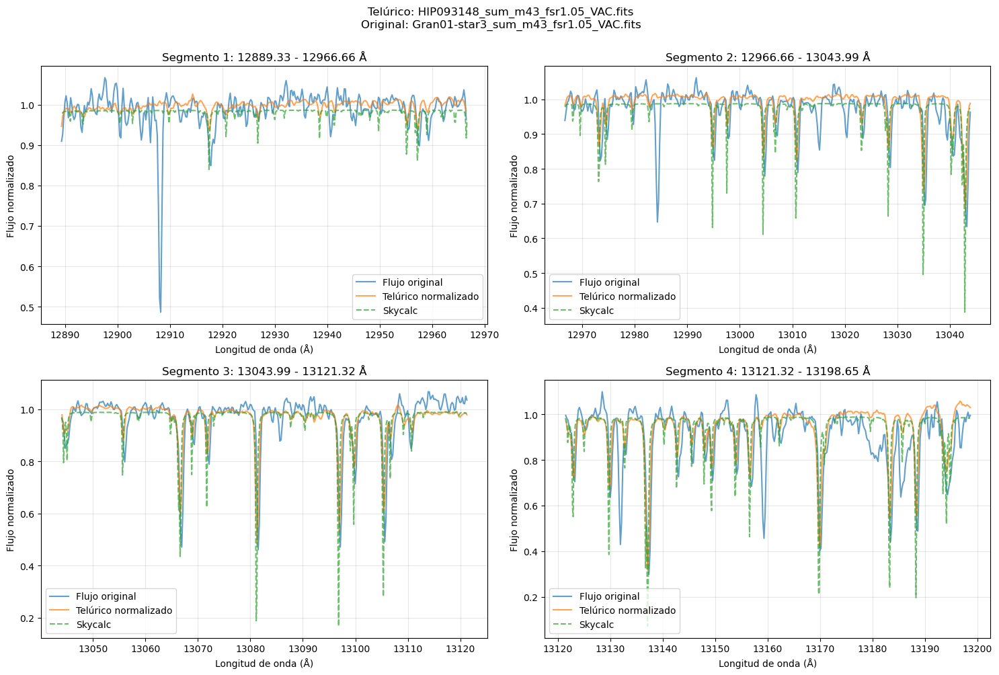

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m44_fsr1.05_VAC_segmentado.png


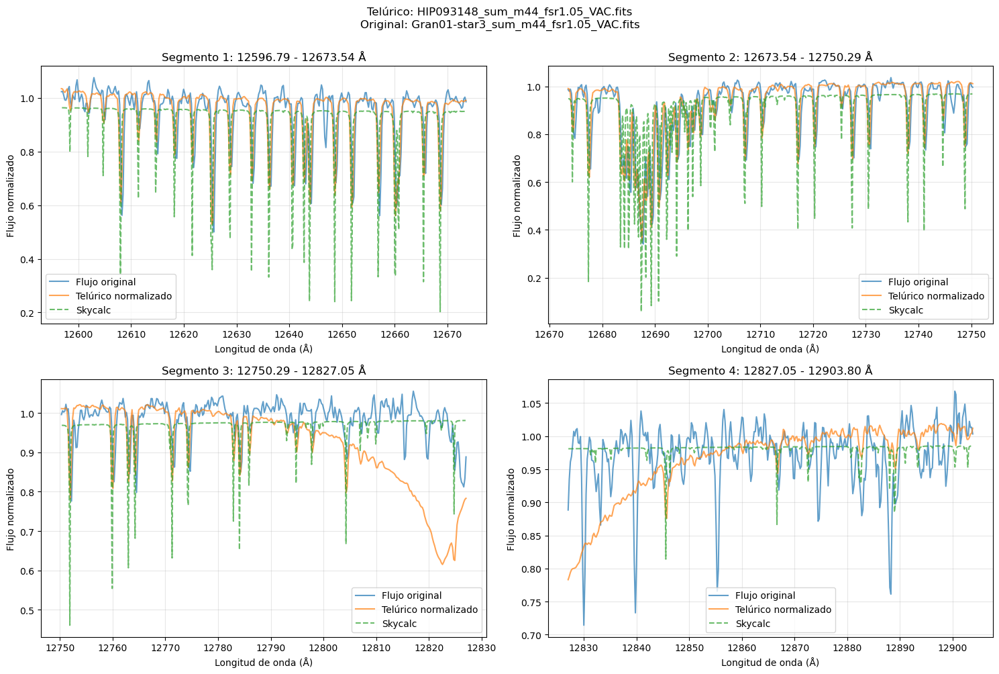

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m45_fsr1.05_VAC_segmentado.png


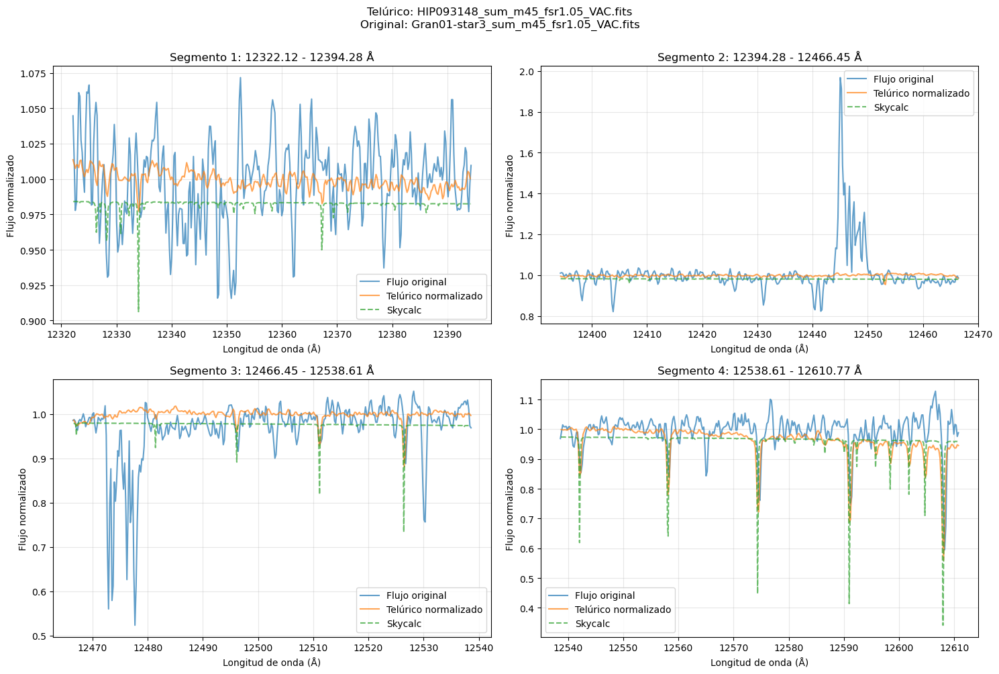

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m46_fsr1.05_VAC_segmentado.png


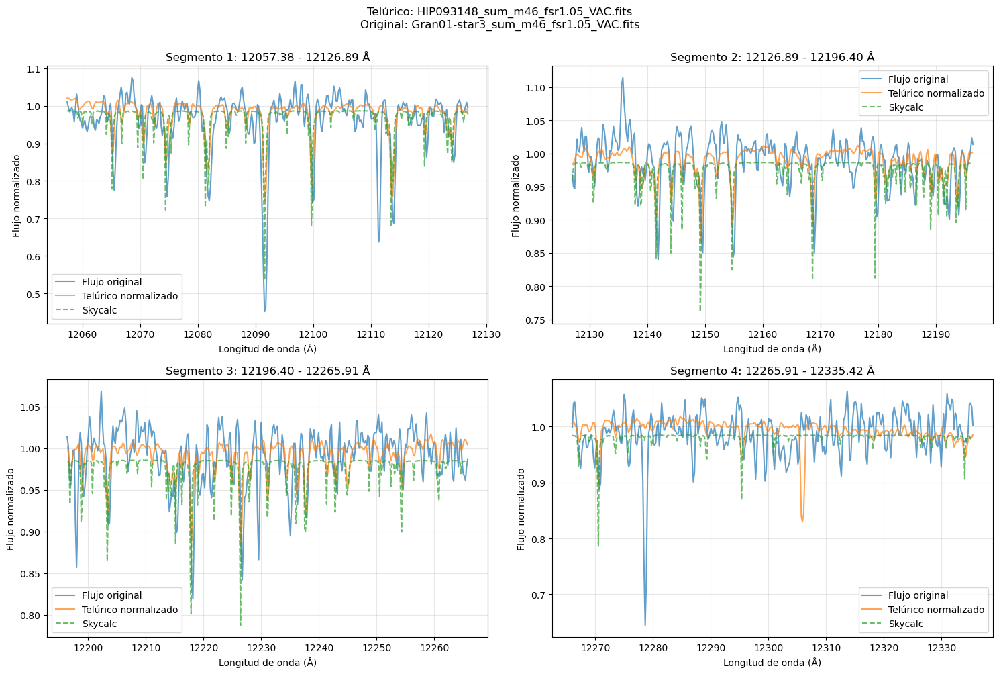

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m47_fsr1.05_VAC_segmentado.png


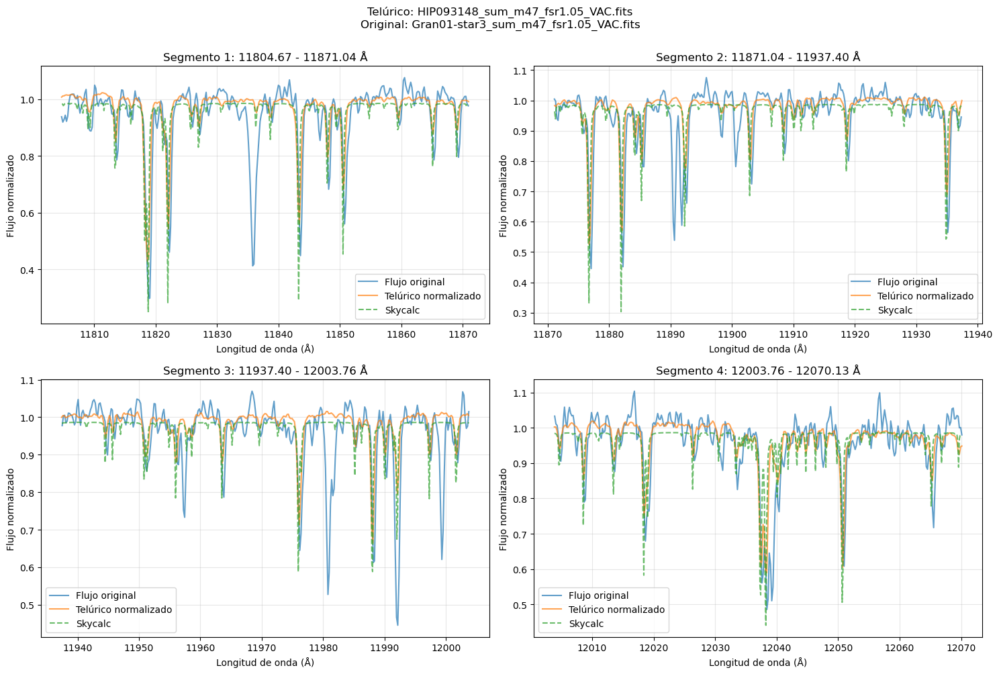

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m48_fsr1.05_VAC_segmentado.png


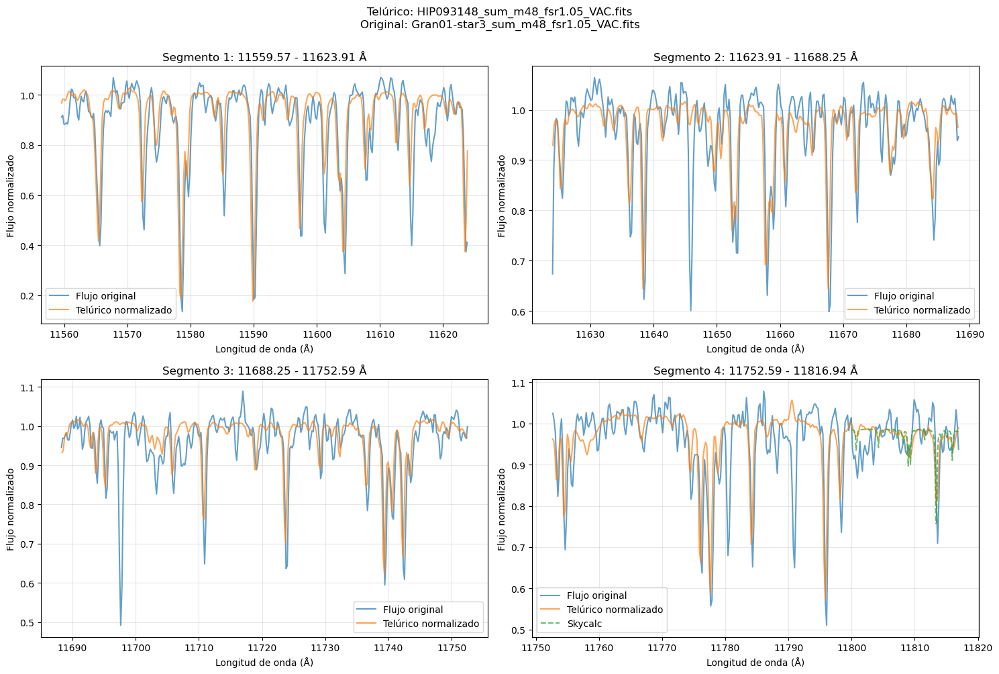

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m51_fsr1.05_VAC_segmentado.png


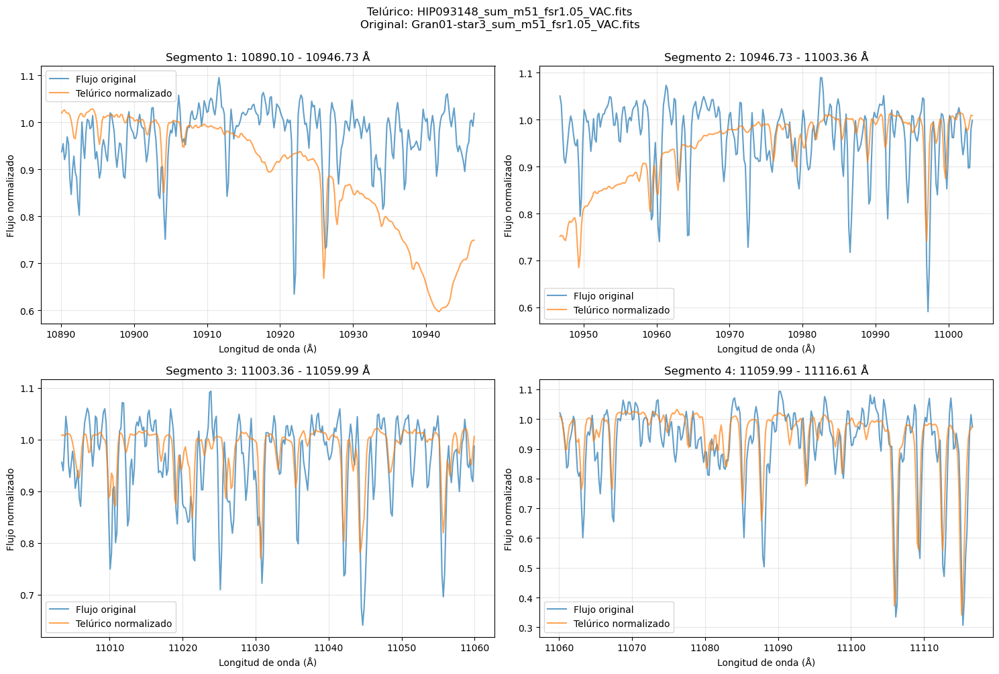

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m52_fsr1.05_VAC_segmentado.png


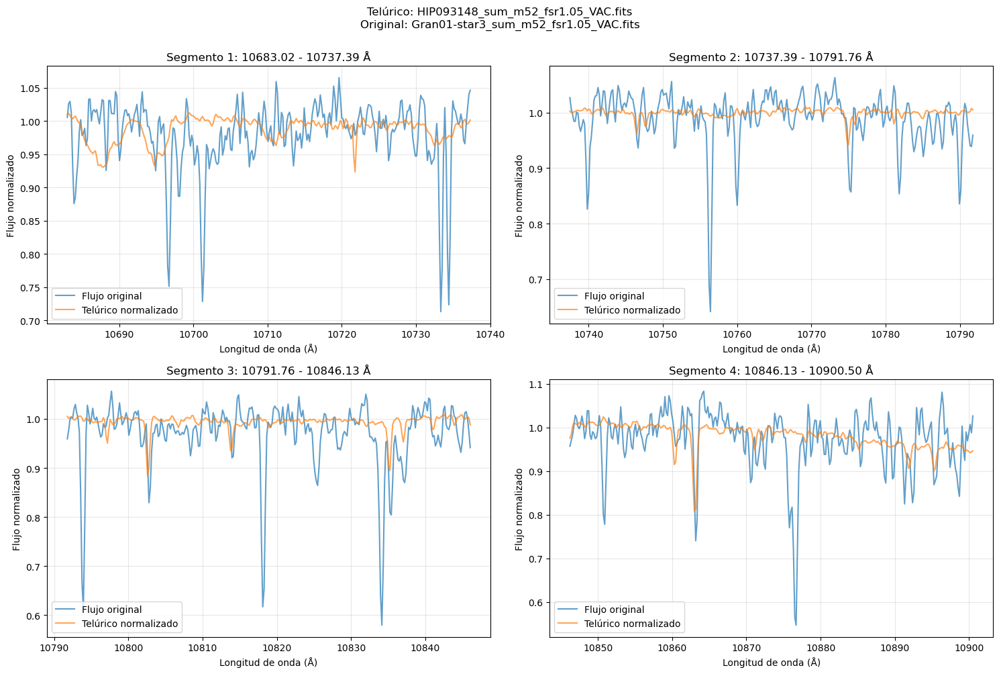

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m53_fsr1.05_VAC_segmentado.png


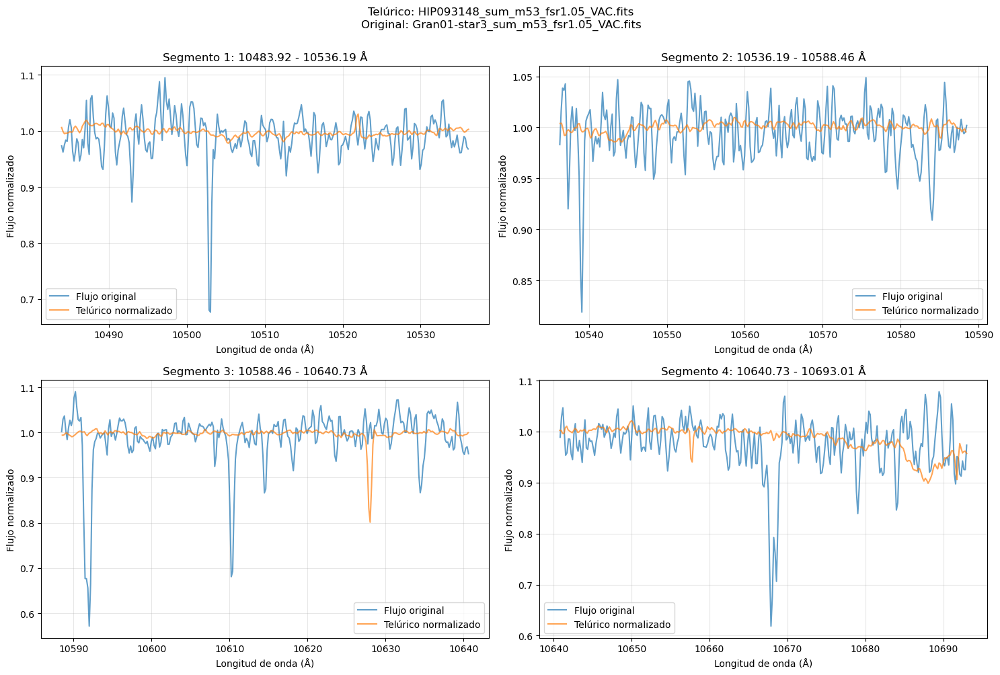

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m54_fsr1.05_VAC_segmentado.png


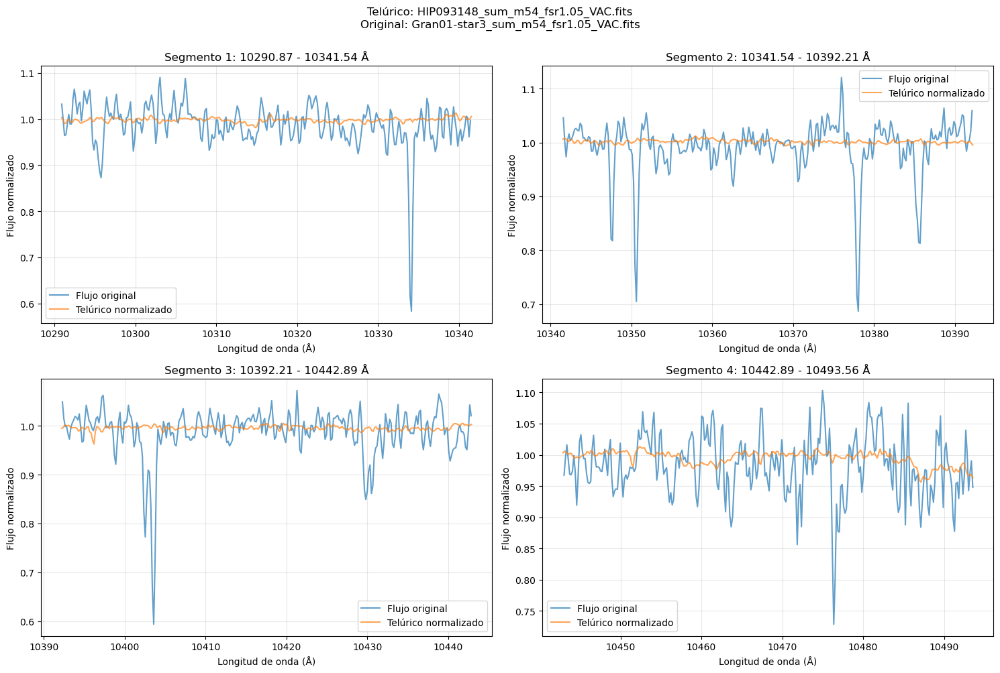

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m55_fsr1.05_VAC_segmentado.png


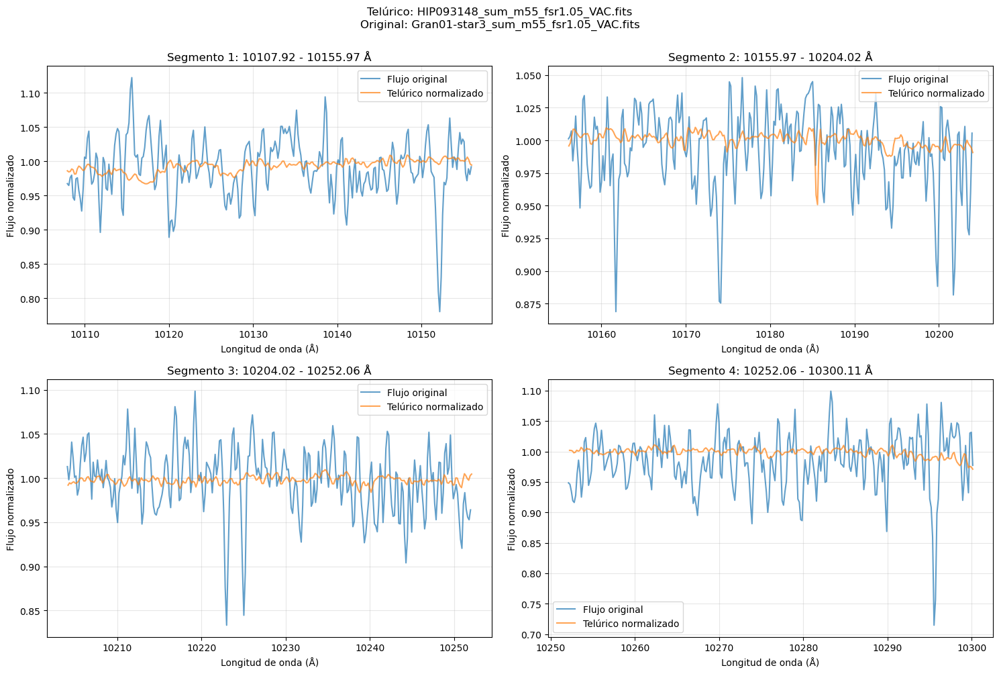

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m56_fsr1.05_VAC_segmentado.png


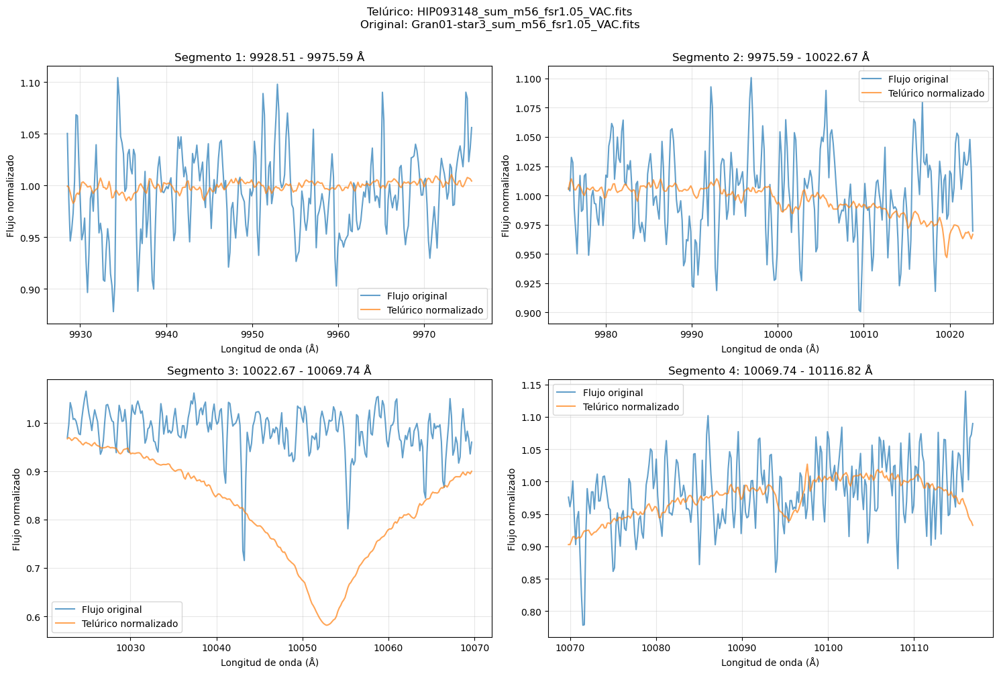

Guardado: /home/nacho/molecfit_test/graficos_originales_con_telurica/Gran01-star3_sum_m57_fsr1.05_VAC_segmentado.png


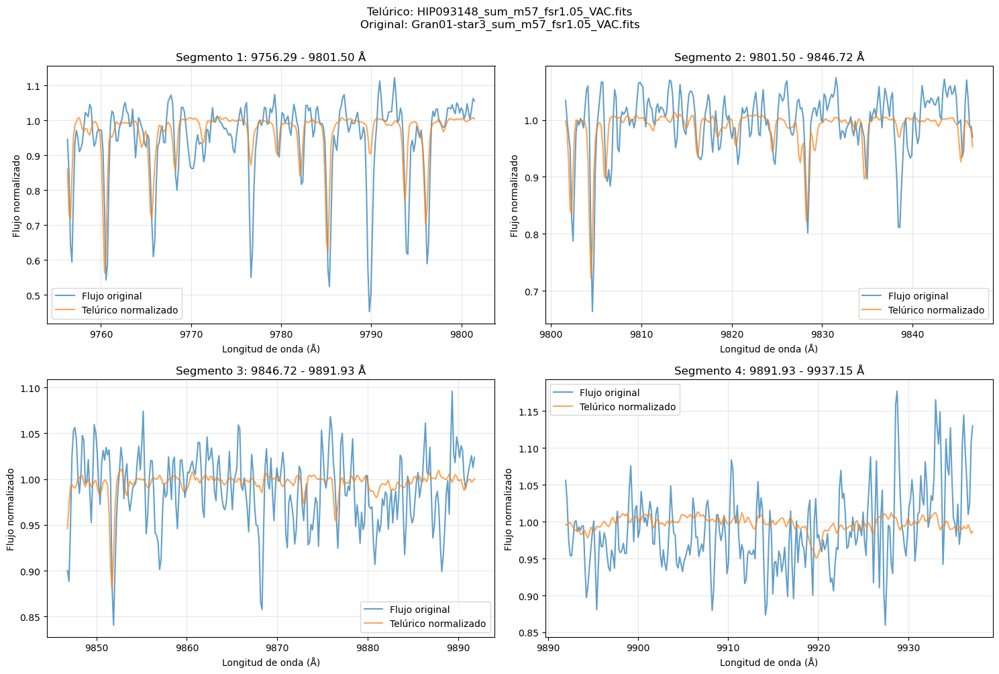

In [25]:
archivo = "/home/nacho/molecfit_test/ordenes_VACstar1/"
ruta_telurica = "/home/nacho/molecfit_test/ordenes_telurica_utiles/"
carpeta_salida = "/home/nacho/molecfit_test/graficos_originales_con_telurica"
plot_telluric_encima(archivo,ruta_telurica,carpeta_salida ,patron= '*.fits')

Archivos telúricos: ['/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m43_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m44_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m45_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m46_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m47_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m48_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m51_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m52_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m53_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m54_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m55_fsr1.05_VAC.fits', '/home/nach

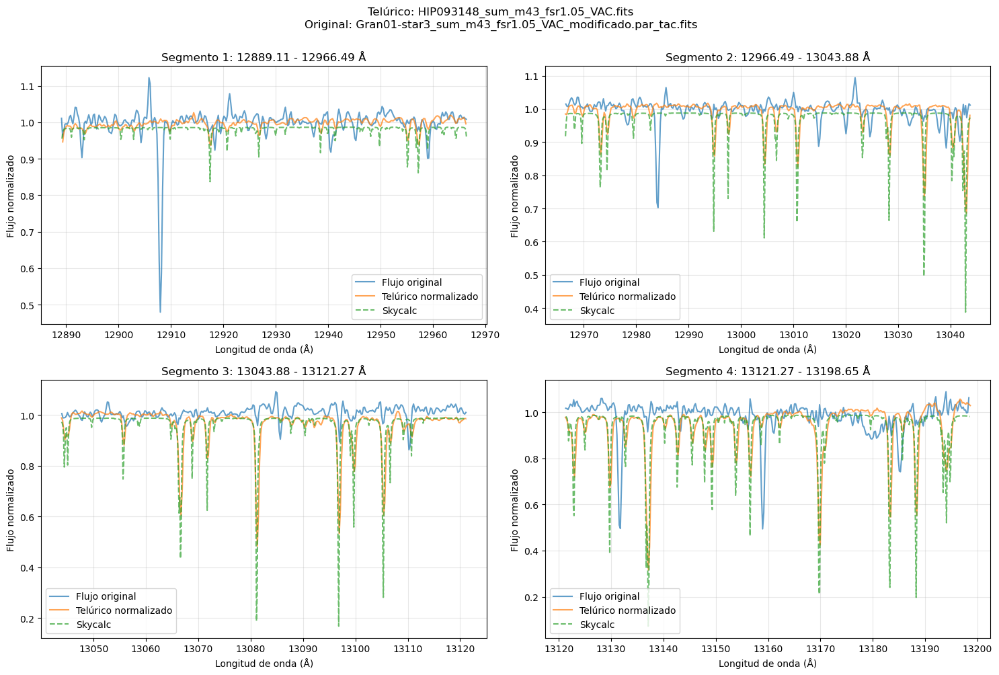

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m44_fsr1.05_VAC_modificado.par_tac_segmentado.png


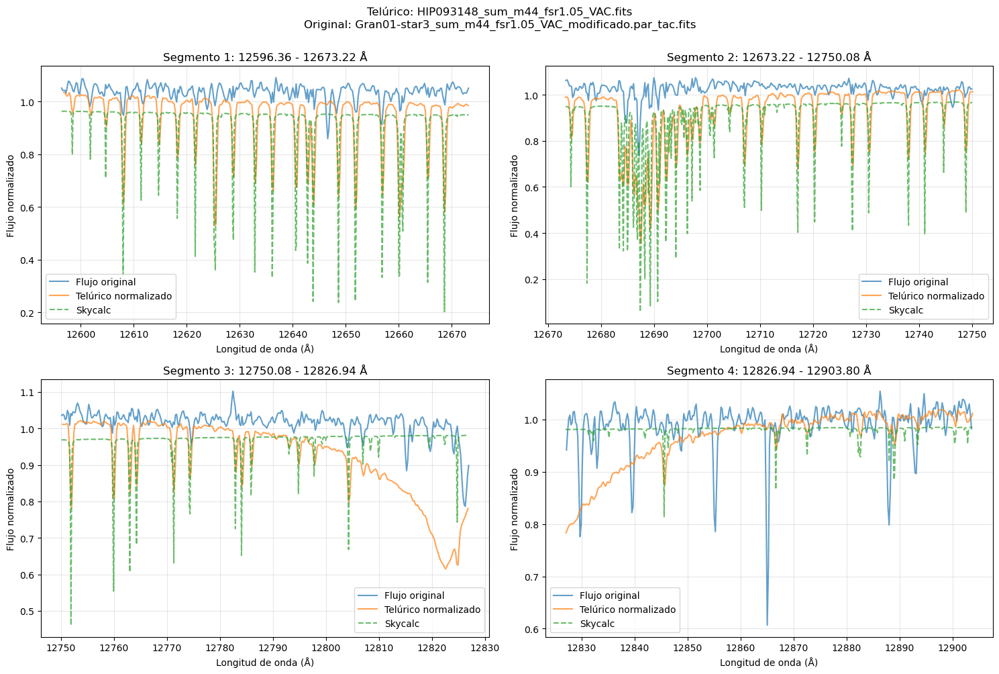

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m45_fsr1.05_VAC_modificado.par_tac_segmentado.png


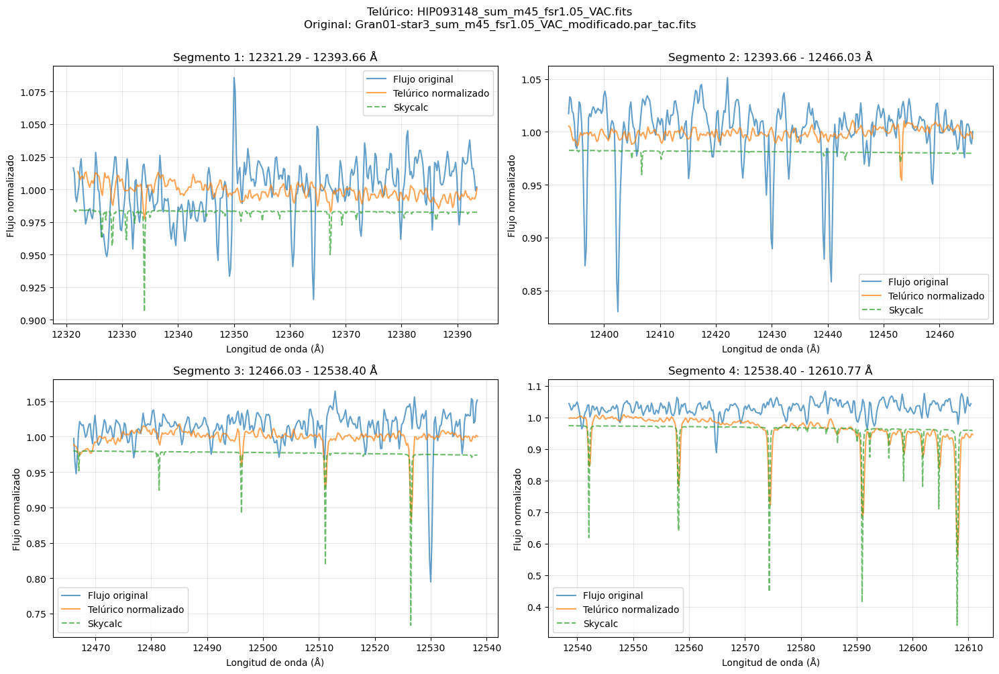

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m46_fsr1.05_VAC_modificado.par_tac_segmentado.png


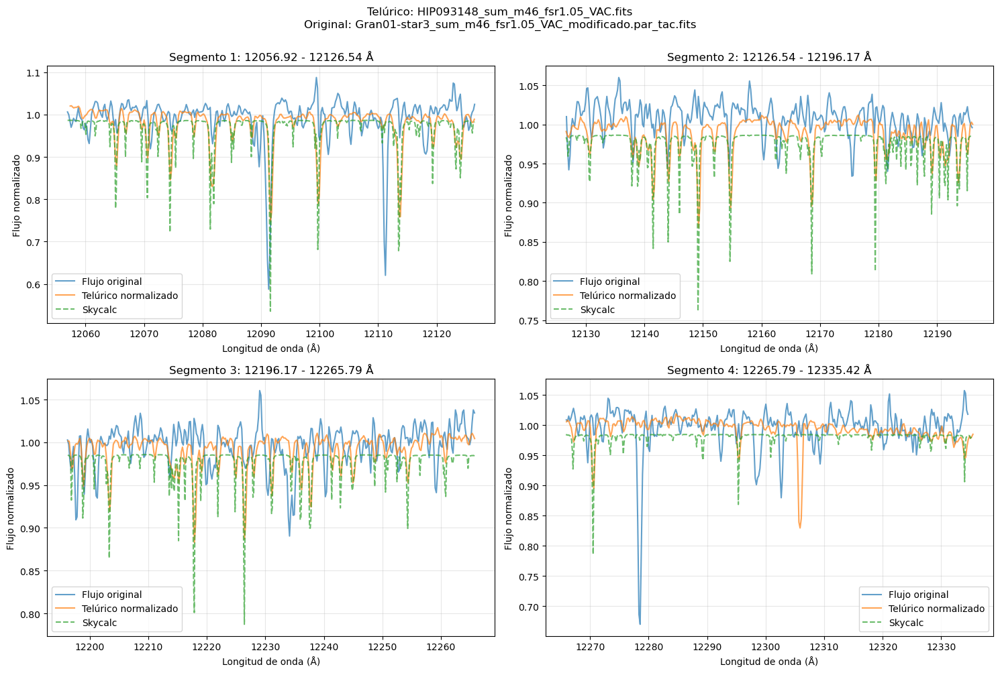

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m47_fsr1.05_VAC_modificado.par_tac_segmentado.png


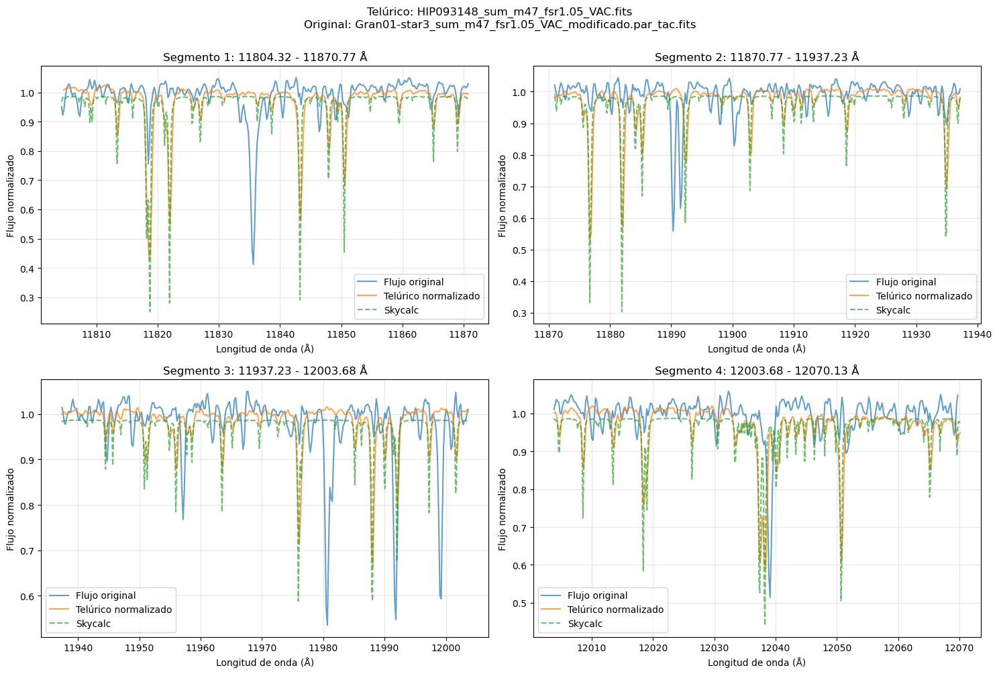

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m48_fsr1.05_VAC_modificado.par_tac_segmentado.png


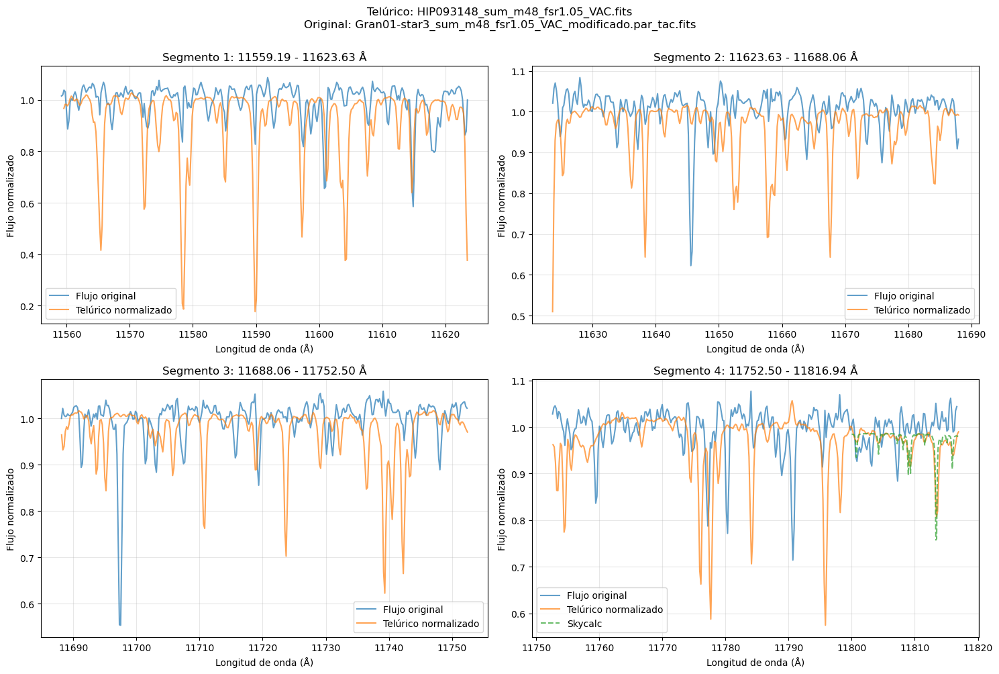

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m51_fsr1.05_VAC_modificado.par_tac_segmentado.png


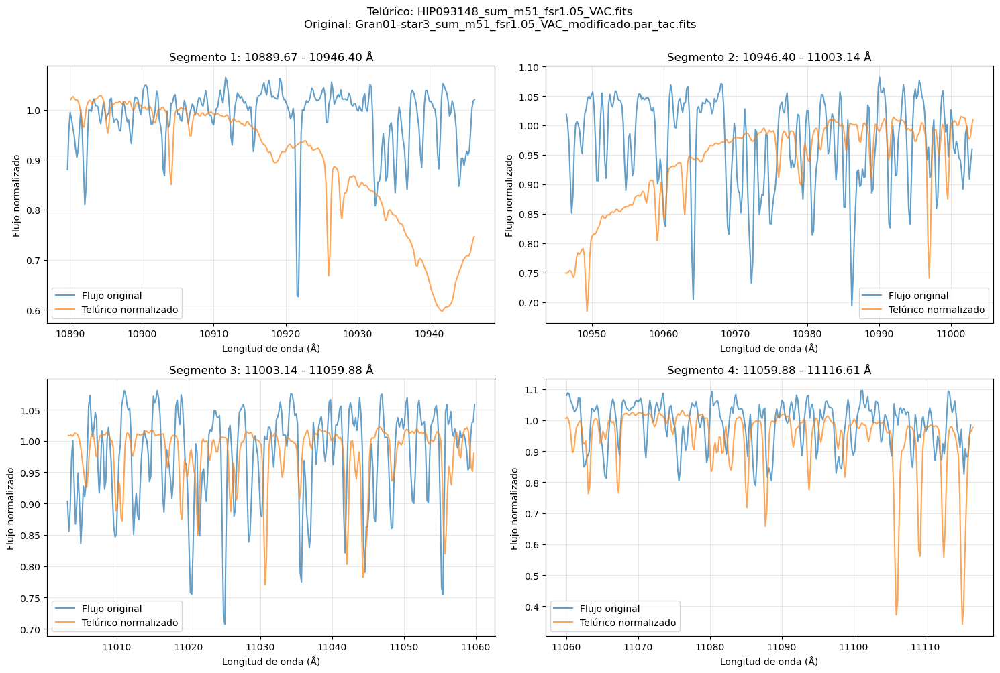

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m52_fsr1.05_VAC_modificado.par_tac_segmentado.png


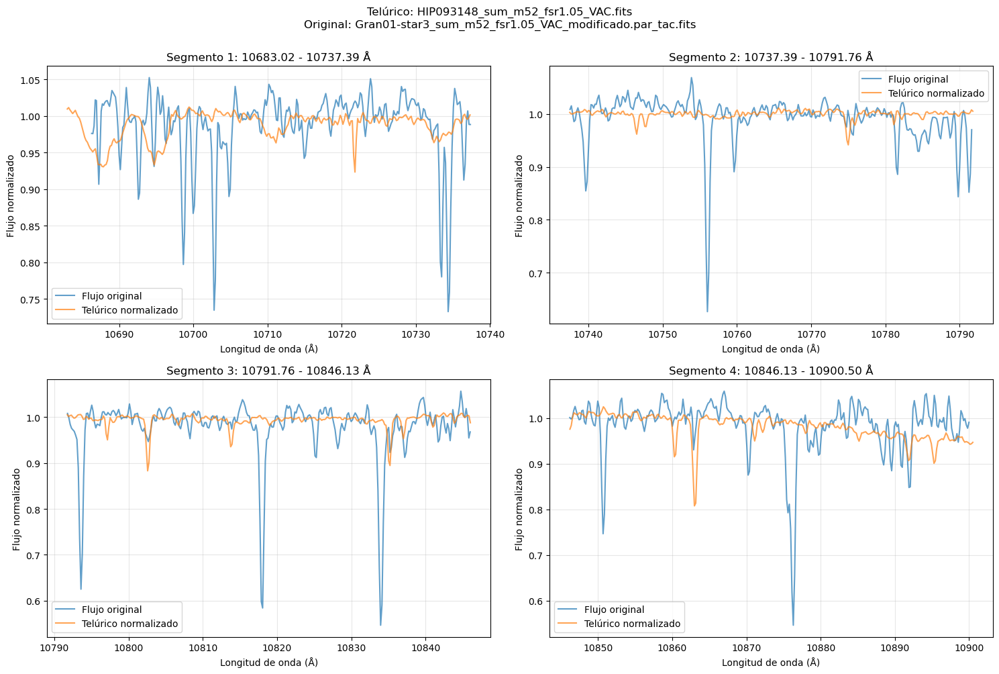

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m53_fsr1.05_VAC_modificado.par_tac_segmentado.png


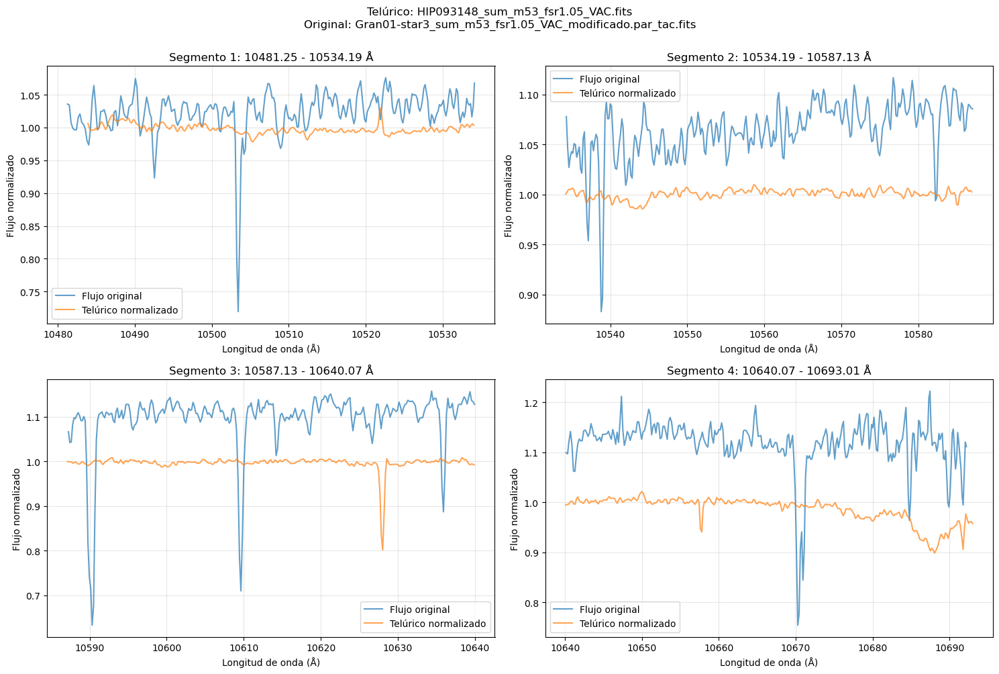

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m54_fsr1.05_VAC_modificado.par_tac_segmentado.png


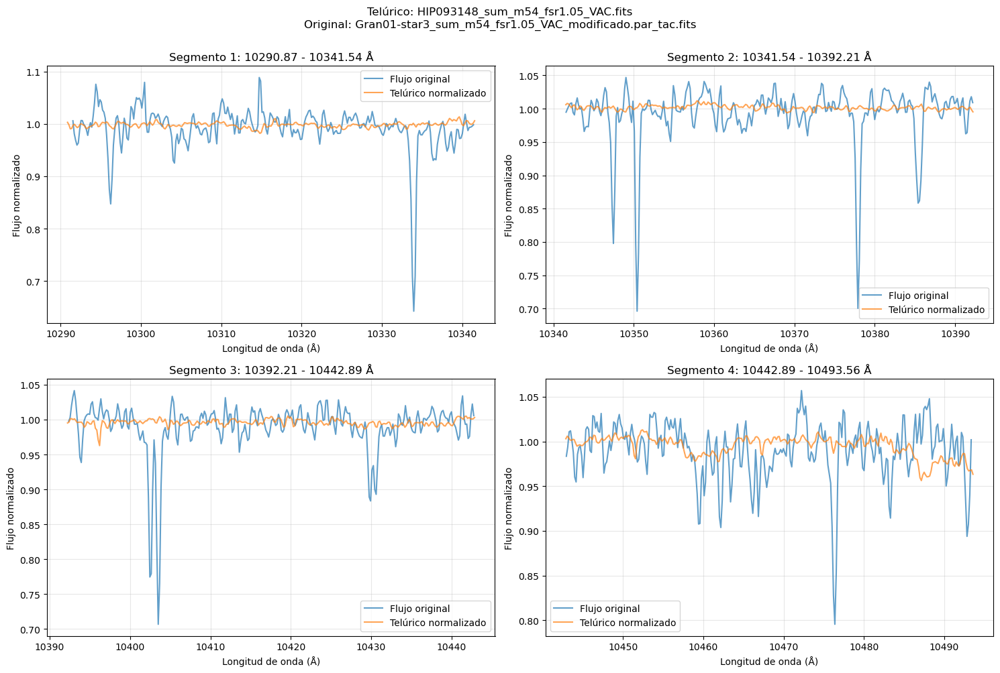

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m55_fsr1.05_VAC_modificado.par_tac_segmentado.png


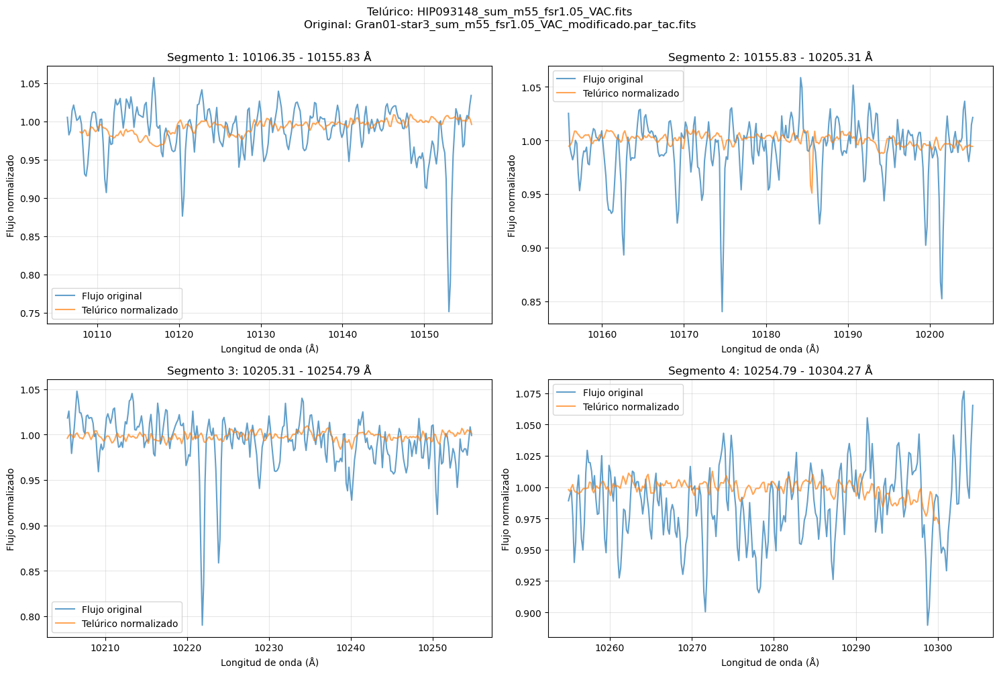

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m56_fsr1.05_VAC_modificado.par_tac_segmentado.png


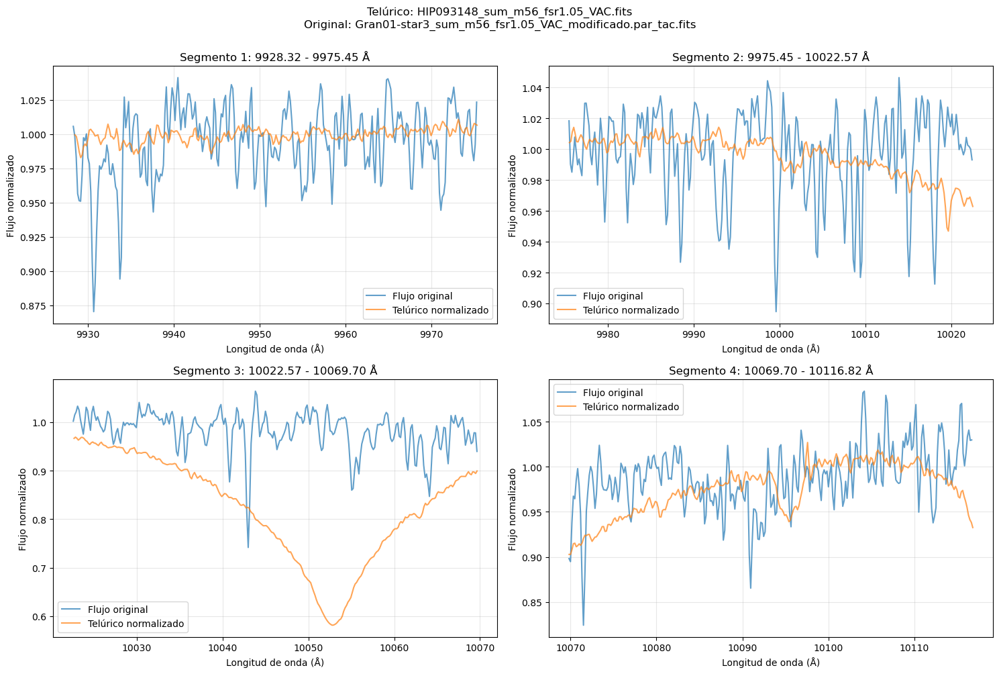

Guardado: /home/nacho/molecfit_test/graficos_calctrans_con_telurica/Gran01-star3_sum_m57_fsr1.05_VAC_modificado.par_tac_segmentado.png


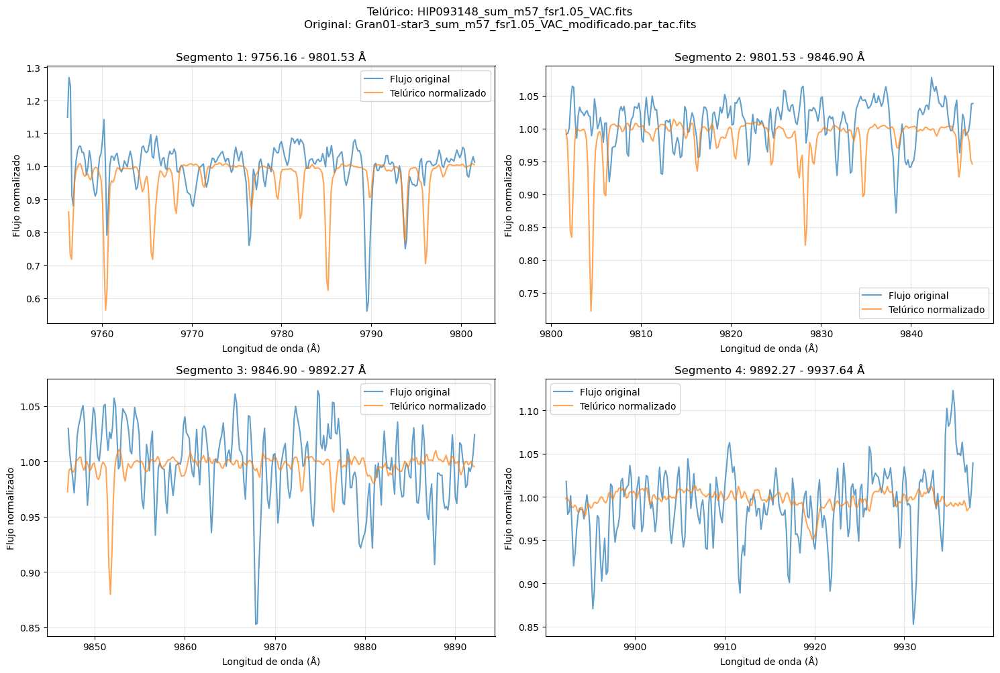

In [32]:
archivo = "/home/nacho/molecfit_test/mis_outputsVAC_star1/"
ruta_telurica = "/home/nacho/molecfit_test/ordenes_telurica_utiles/"
carpeta_salida = "/home/nacho/molecfit_test/graficos_calctrans_con_telurica"
plot_telluric_encima(archivo, ruta_telurica,carpeta_salida,patron='*par_tac.fits')

In [52]:
def comparar_todo(carpeta_fits, carpeta_corregida, carpeta, archivo_guardar):
    
    """inputs: carpeta_fits: es la carpeta correspondiente a los archivos fits a comparar con 
    la telurica
    carpeta_corregida: carpeta con los archivos corregidos por calctrans
    carpeta: corresponde a la carpeta en la cual están los archivos fits de las teluricas
    archivo_guardar: ruta de la carpeta donde se guardaran las imagenes, esta carpeta puede 
    no existir"""
    
    # Archivo skycalc
    long_sk = []
    flux_sk = []
    with open("/home/nacho/molecfit_test/transmission_J_AUG.txt", 'r') as txt:
        for linea in txt:
            partes = linea.strip().split()
            long_sk.append(float(partes[0]) * 10)
            flux_sk.append(float(partes[1]))
    
    # Convertir a arrays numpy para facilitar el manejo
    long_sk = np.array(long_sk)
    flux_sk = np.array(flux_sk)
    
    archivos_telurica = glob.glob(os.path.join(carpeta, '*fits'))
    archivos_telurica.sort()
    
    # Buscar archivos según el patrón especificado
    archivos = glob.glob(os.path.join(carpeta_fits, '*fits'))
    archivos.sort()

    archivos_corr = glob.glob(os.path.join(carpeta_corregida, '*par_tac.fits'))
    archivos_corr.sort()
    
    # Crear directorio para guardar las figuras
    os.makedirs(archivo_guardar, exist_ok=True)
    
    print("Archivos telúricos:", archivos_telurica)
    print("Archivos originales:", archivos)
    print("Archivos corregidos:", archivos_corr)
    
    # Asegurarse de que tenemos el mismo número de archivos
    if len(archivos_telurica) != len(archivos):
        print(f"¡Advertencia! Número diferente de archivos: {len(archivos_telurica)} vs {len(archivos)}")
        
    if len(archivos_corr) != len(archivos):
        print(f"¡Advertencia! Número diferente de archivos corregidos: {len(archivos_corr)} vs {len(archivos)}")
        
    for i, a, j in zip(archivos_telurica, archivos, archivos_corr):
        # Extraer datos telúricos
        long_ond_tel, flux_norm_tel = extraer_datos_originales(i)
        
        # Extraer datos corregidos
        long_ond_corr, flux_corr = extraer_datos_calctrans(j)

        # Extraer datos originales
        long_ond_orig, flux_orig = extraer_datos_originales(a)
        
        # Determinar el rango de longitud de onda considerando también los datos corregidos
        long_min = min(long_ond_orig.min(), long_ond_tel.min(), long_ond_corr.min())
        long_max = max(long_ond_orig.max(), long_ond_tel.max(), long_ond_corr.max())
        
        # Dividir el rango en 4 segmentos
        segmentos = np.linspace(long_min, long_max, 5)
        
        # Crear figura con 4 subplots (2x2)
        fig, axes = plt.subplots(2, 2, figsize=(16, 11))
        axes = axes.flatten()
        
        for idx in range(4):
            # Límites del segmento actual
            lim_inf = segmentos[idx]
            lim_sup = segmentos[idx + 1]
     

            # Máscaras para cada segmento
            mask_corr = (long_ond_corr >= lim_inf) & (long_ond_corr <= lim_sup)
            mask_orig = (long_ond_orig >= lim_inf) & (long_ond_orig <= lim_sup)
            mask_tel = (long_ond_tel >= lim_inf) & (long_ond_tel <= lim_sup)
            mask_sk = (long_sk >= lim_inf) & (long_sk <= lim_sup)
            # Filtrar datos originales para este segmento
            
            long_seg_orig = long_ond_orig[mask_orig]
            flux_seg_orig = flux_orig[mask_orig]

            # Filtrar datos corregidos para este segmento 
            
            long_seg_corr = long_ond_corr[mask_corr]
            flux_seg_corr = flux_corr[mask_corr]
            
            # Filtrar datos telúricos para este segmento
            
            long_seg_tel = long_ond_tel[mask_tel]
            flux_seg_tel = flux_norm_tel[mask_tel]
            
            # Filtrar datos skycalc para este segmento
            
            long_seg_sk = long_sk[mask_sk]
            flux_seg_sk = flux_sk[mask_sk]
            
            # Graficar en el subplot correspondiente con colores distintivos
            axes[idx].plot(long_seg_orig, flux_seg_orig, label='Flujo original', 
                          alpha=0.6, linewidth=1.5, color='blue')
            axes[idx].plot(long_seg_corr, flux_seg_corr, label='Flujo corregido', 
                          alpha=0.7, linewidth=1.5, color='red')
            axes[idx].plot(long_seg_tel, flux_seg_tel, label='Telúrico normalizado', 
                          alpha=0.5, linewidth=1, color='green')
            
            # Graficar skycalc solo si hay datos en este segmento
            if len(long_seg_sk) > 0:
                axes[idx].plot(long_seg_sk, flux_seg_sk, label='Skycalc', 
                              alpha=0.6, linestyle='--', linewidth=1.2, color='orange')
            
            axes[idx].set_title(f"Segmento {idx+1}: {lim_inf:.2f} - {lim_sup:.2f} Å", 
                               fontsize=11, fontweight='bold')
            axes[idx].set_xlabel("Longitud de onda (Å)", fontsize=10)
            axes[idx].set_ylabel("Flujo normalizado", fontsize=10)
            axes[idx].legend(loc='best', fontsize=9)
            axes[idx].grid(True, alpha=0.3, linestyle=':')
            
            # Calcular desplazamiento promedio si ambos tienen datos
           
        
        fig.suptitle(f"Telúrico: {os.path.basename(i)}\n" + 
                     f"Original: {os.path.basename(a)}\n" +
                     f"Corregido: {os.path.basename(j)}", 
                     fontsize=12, y=0.995, fontweight='bold')
        plt.tight_layout()
        
        # Guardar figura
        nombre_archivo = f"{os.path.splitext(os.path.basename(a))[0]}_comparacion_completa.png"
        ruta_completa = os.path.join(archivo_guardar, nombre_archivo)
        plt.savefig(ruta_completa, dpi=150, bbox_inches='tight')
        print(f"Guardado: {ruta_completa}")
        
        plt.show()
        plt.close(fig)  # Cerrar la figura para liberar memoria

Archivos telúricos: ['/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m43_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m44_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m45_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m46_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m47_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m48_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m51_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m52_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m53_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m54_fsr1.05_VAC.fits', '/home/nacho/molecfit_test/ordenes_telurica_utiles/HIP093148_sum_m55_fsr1.05_VAC.fits', '/home/nach

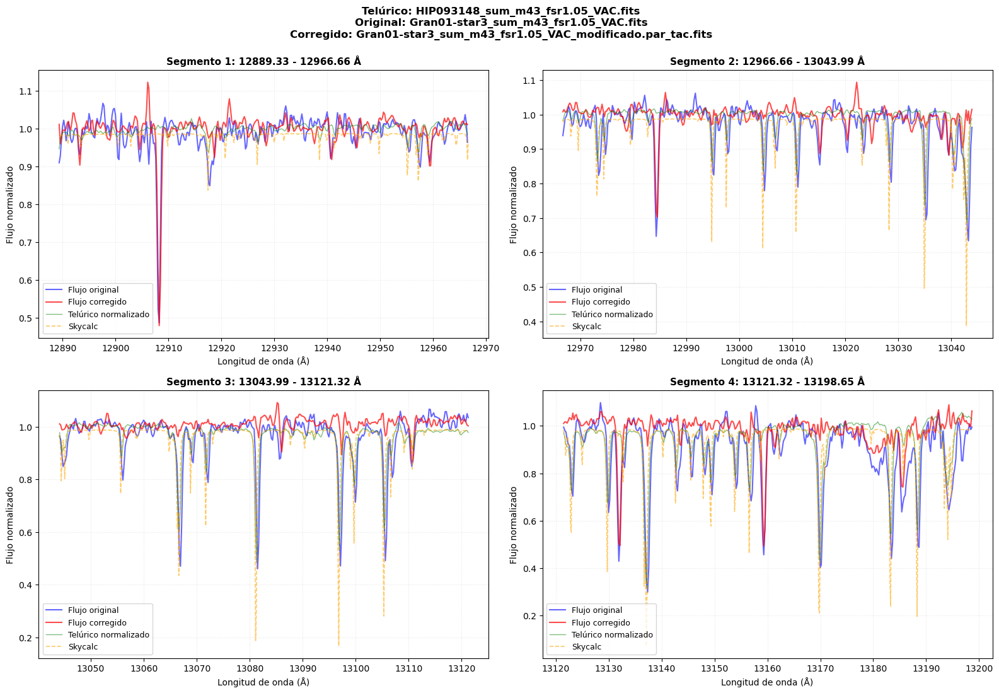

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m44_fsr1.05_VAC_comparacion_completa.png


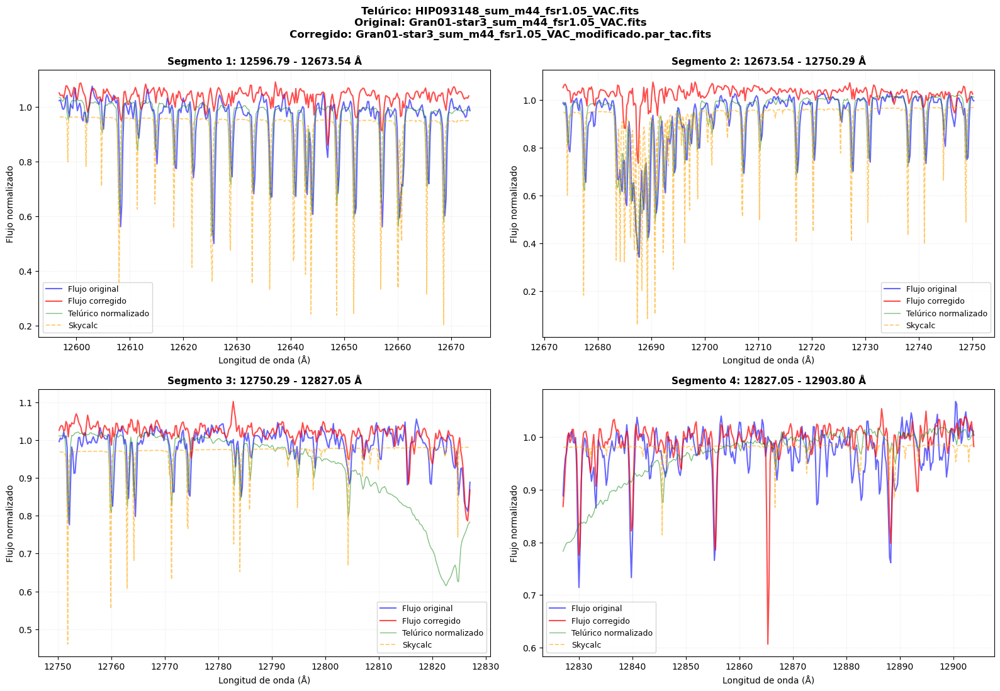

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m45_fsr1.05_VAC_comparacion_completa.png


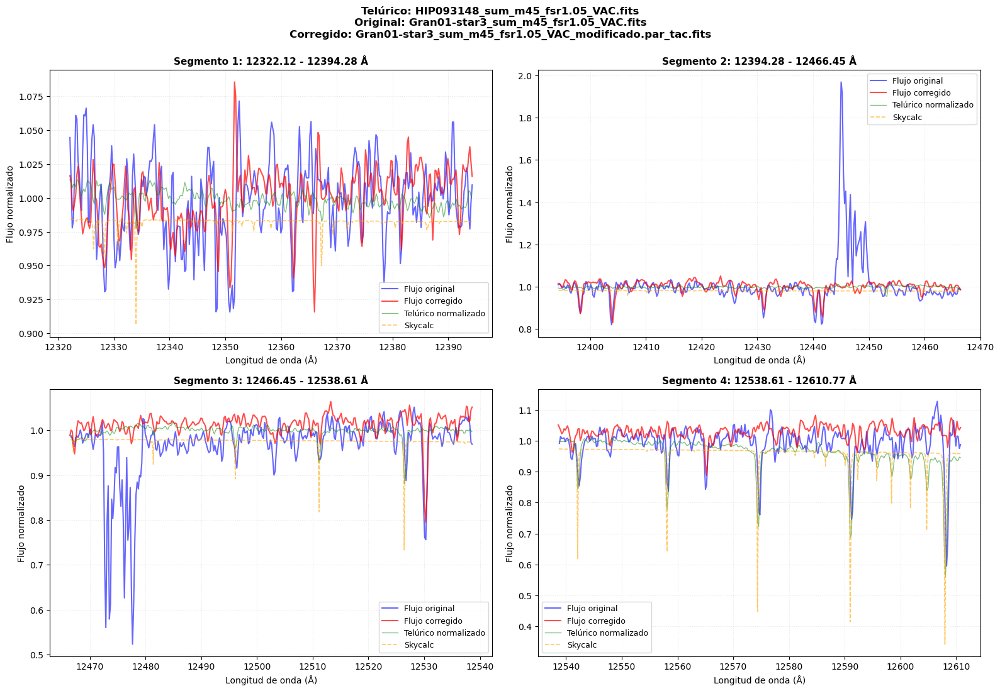

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m46_fsr1.05_VAC_comparacion_completa.png


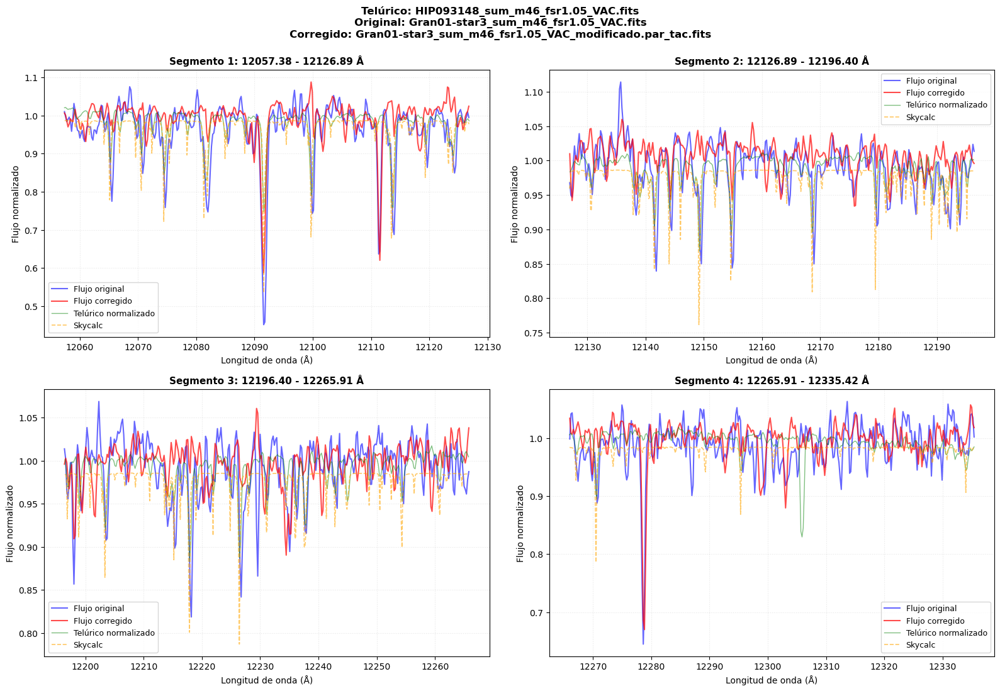

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m47_fsr1.05_VAC_comparacion_completa.png


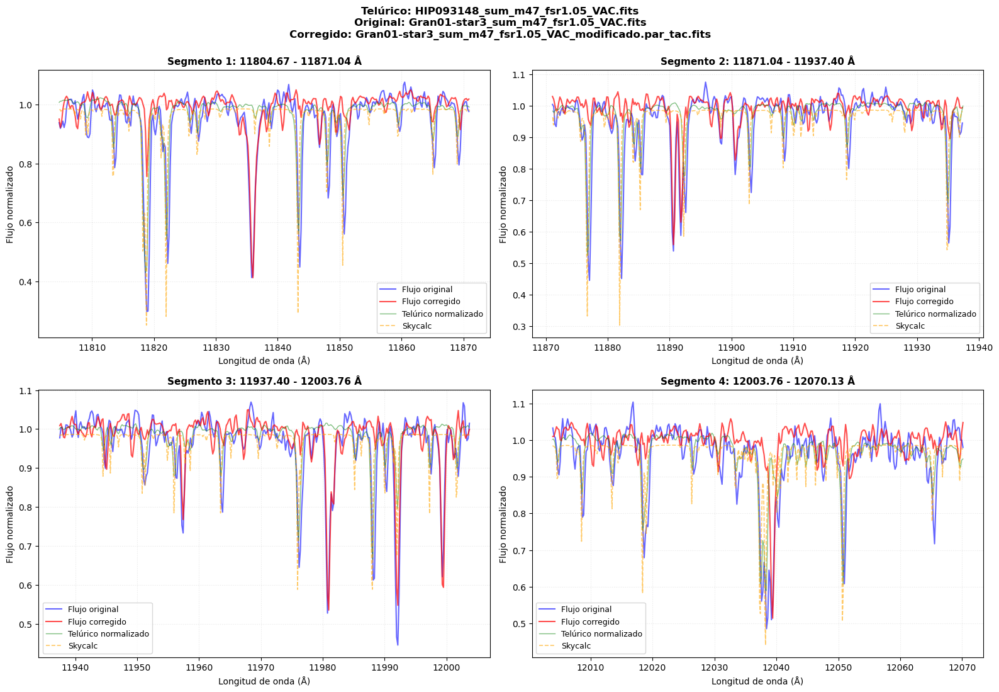

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m48_fsr1.05_VAC_comparacion_completa.png


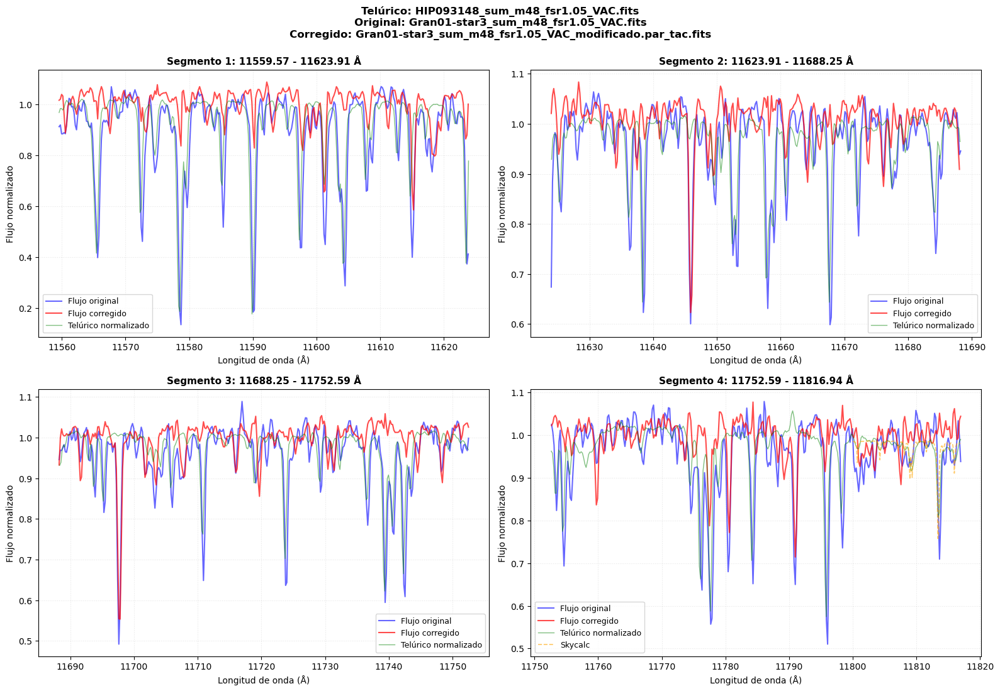

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m51_fsr1.05_VAC_comparacion_completa.png


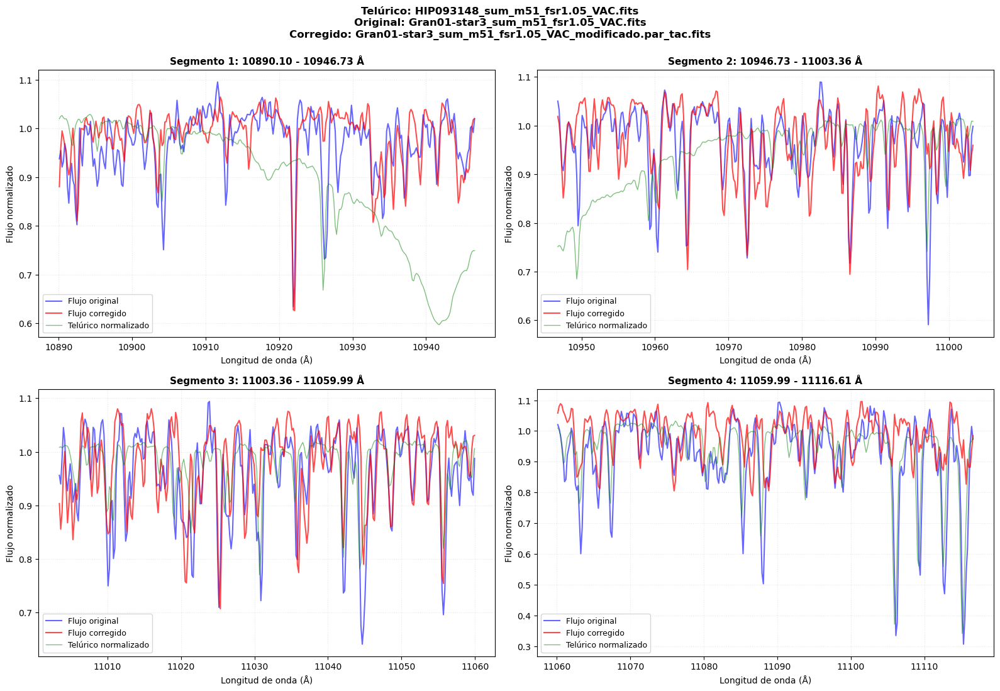

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m52_fsr1.05_VAC_comparacion_completa.png


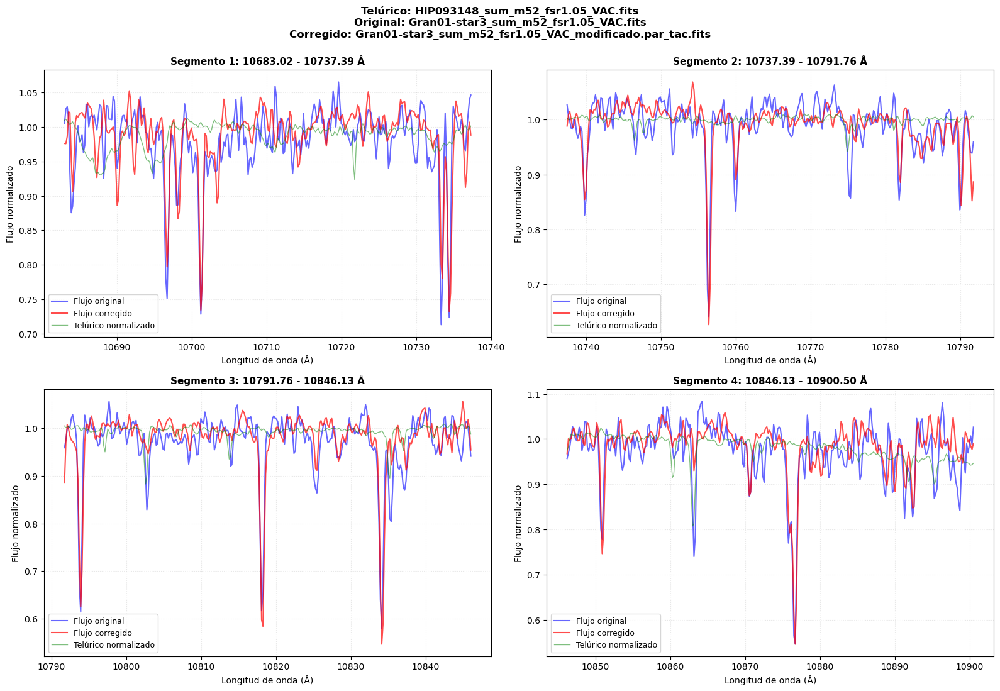

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m53_fsr1.05_VAC_comparacion_completa.png


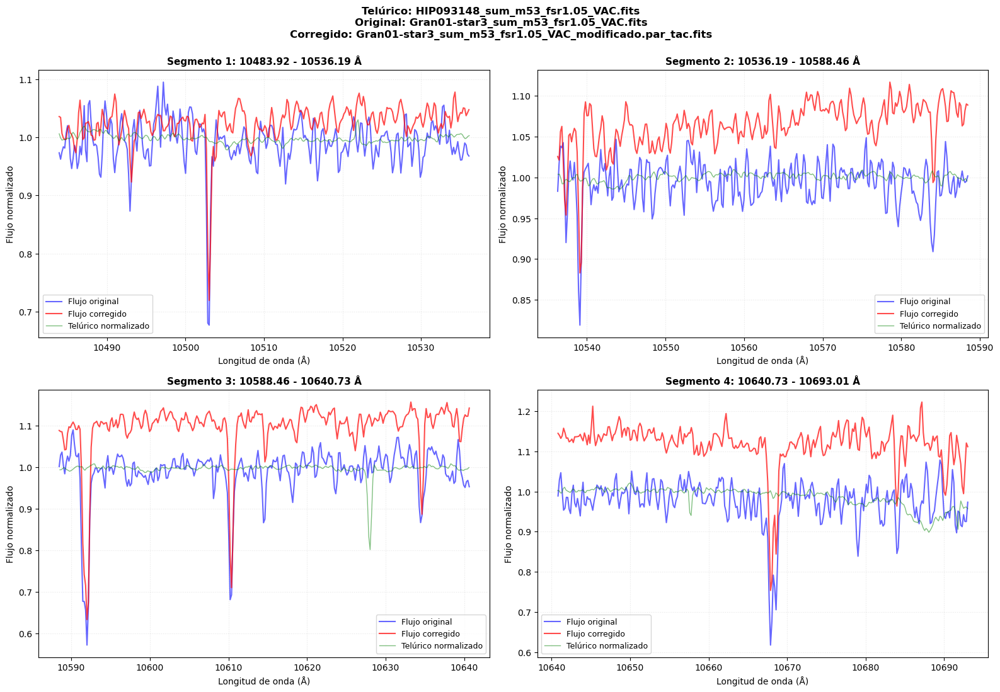

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m54_fsr1.05_VAC_comparacion_completa.png


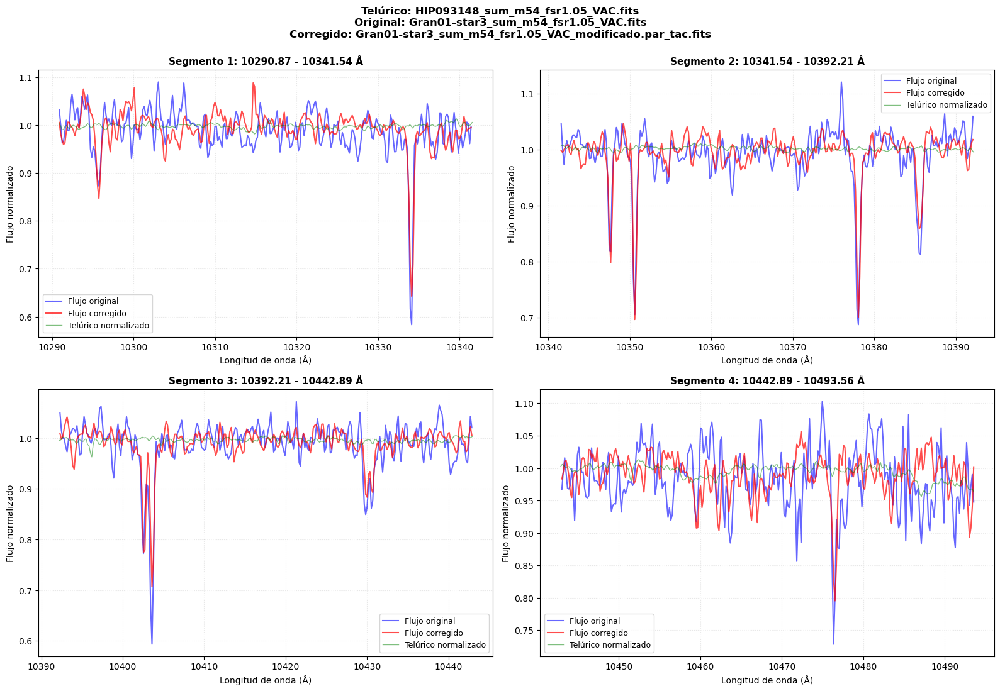

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m55_fsr1.05_VAC_comparacion_completa.png


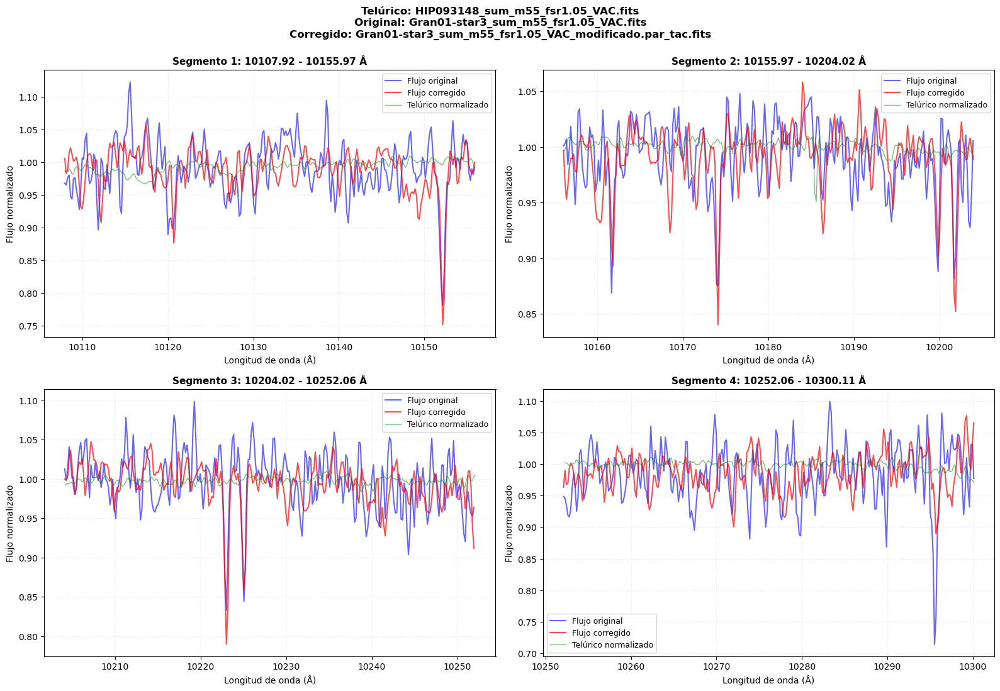

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m56_fsr1.05_VAC_comparacion_completa.png


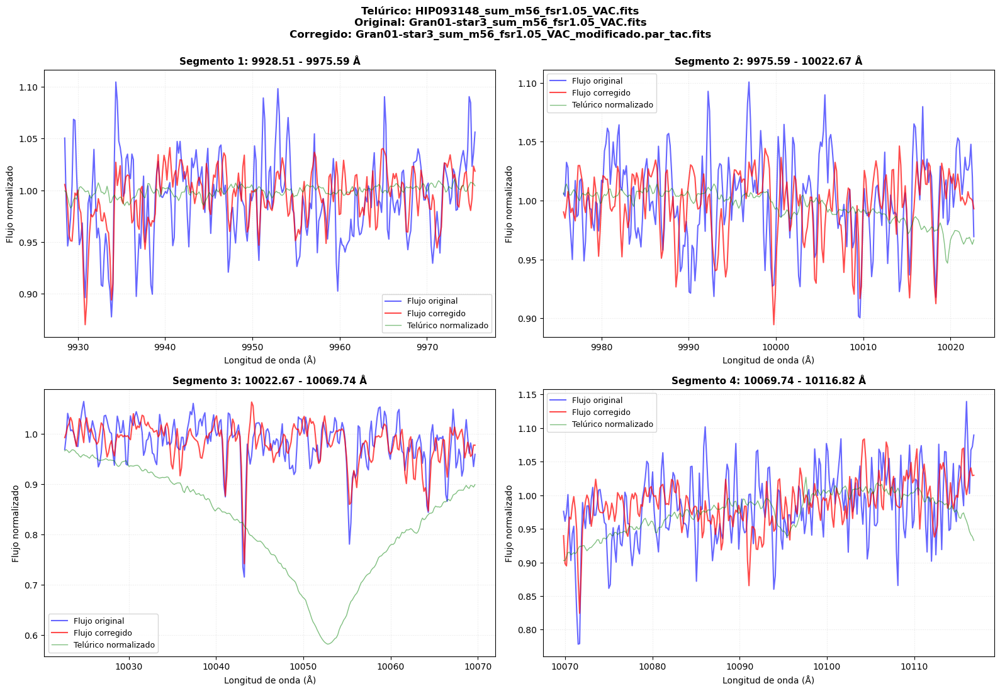

Guardado: /home/nacho/molecfit_test/comparacion_total/Gran01-star3_sum_m57_fsr1.05_VAC_comparacion_completa.png


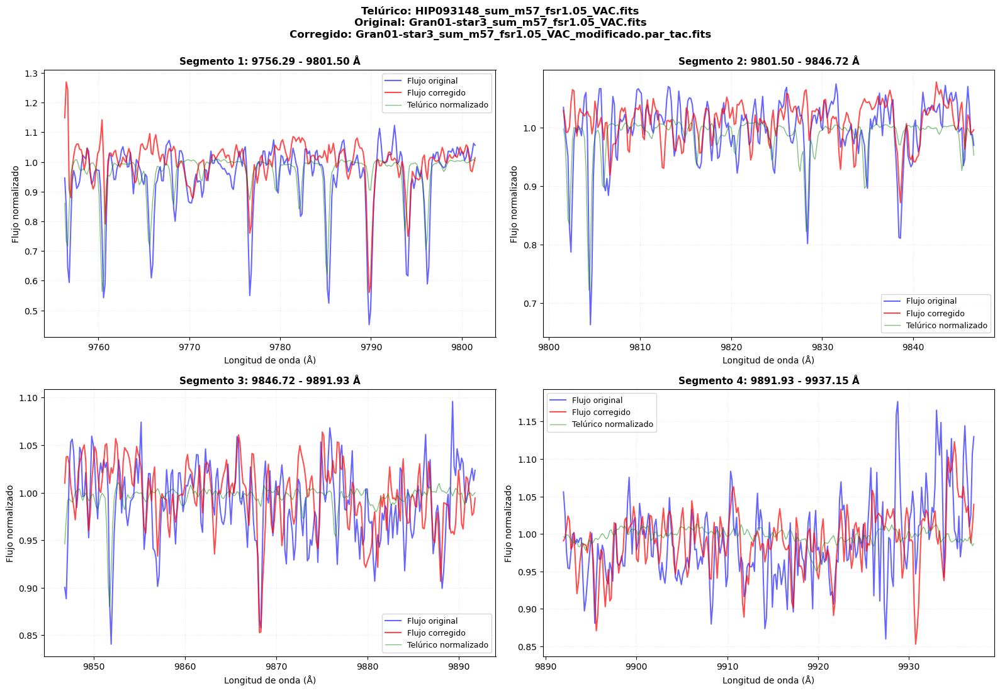

In [53]:
archivo = "/home/nacho/molecfit_test/ordenes_VACstar1/"
archivo_corr = "/home/nacho/molecfit_test/mis_outputsVAC_star1/"
ruta_telurica = "/home/nacho/molecfit_test/ordenes_telurica_utiles/"
carpeta_salida = "/home/nacho/molecfit_test/comparacion_total"
comparar_todo(archivo,archivo_corr,ruta_telurica,carpeta_salida)